In [52]:
"""
In this notebook I will create a pipeline that will take in our preprocessed images as 
matrices of pixel values with labels related by filename and metadata in "train_label_coordinates.csv".

No models or training of models will be done in this notebook.
"""

import os
from PIL import Image
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import shutil

#dataframe containing the metadata for each image and their condition
meta = pd.read_csv('../../data/train_label_coordinates.csv')

#change floats to int
meta['x'] = meta['x'].astype(int)
meta['y'] = meta['y'].astype(int)


In [57]:
"""
RENAMING
Check through each preprocessed image filename and pinpoint it in the metadata dataframe. 
Then copy the image into destination folder and add a digit labeling for the condition at 
the end of the filename.

labeling:
1 --> Left Neural Foraminal Narrowing
2 --> Right Neural Foraminal Narrowing
3 --> Left Subarticular Stenosis
4 --> Right Subarticular Stenosis
5 --> Spinal Canal Stenosis

Goal Example: 
'4003253_702807833_8_320_295_5.png'
- study_id = 4003253
- series_id = 702807833
- instance_number = 8
- Coordinate of center of condition in image:
    - x = 320
    - y = 295
- CONDITION = 5   <----  trying to add this digit at the end of the filename for later image labeling 
"""

#directory = '../../data/temp_data'
directory = '../../data/preprocessed'
destination =  '../../data/preprocessed_renamed'

for filename in os.listdir(directory):

    #separate filename values
    filename_no_ext = filename.replace('.png', '')
    cols = filename_no_ext.split('_')

    #get the value for each column for identification
    study = int(cols[0])
    series = int(cols[1])
    inst = int(cols[2])
    x_coord = int(cols[3])
    y_coord = int(cols[4])
    
    #setup column condition to find the row for this specific image
    curr_row_cond = (
            (meta['study_id'] == study) &
            (meta['series_id'] == series) &
            (meta['instance_number'] == inst) &
            (meta['x'] == x_coord) &
            (meta['y'] == y_coord)
        )
    row = meta[curr_row_cond]
    print(row)
    
    #get spine condition label
    label = row['condition'].values[0]

    
    #rename/add to existing filename based on condition
    if label == 'Left Neural Foraminal Narrowing':
        new_filename = f'{filename_no_ext}_{1}.png'

    elif label == 'Right Neural Foraminal Narrowing':
        new_filename = f'{filename_no_ext}_{2}.png'

    elif label == 'Left Subarticular Stenosis':
        new_filename = f'{filename_no_ext}_{3}.png'

    elif label == 'Right Subarticular Stenosis':
        new_filename = f'{filename_no_ext}_{4}.png'

    elif label == 'Spinal Canal Stenosis':
        new_filename = f'{filename_no_ext}_{5}.png'

    #copy original image to new folder with renamed filename
    old_path = os.path.join(directory, filename)
    new_path = os.path.join(destination, new_filename)
    shutil.copy(old_path, new_path)
        
"""
Original preprocessed images that had issues:
- 3931051195_3679343192_8_237_233.png (supposed to be ..._234.png)
- 4055006120_2032872355_18_253_245.png (supposed to be ..._246.png)
- 4055006120_2032872355_3_263_251.png (supposed to be ..._252.png)
- 778765559_652460766_17_304_239.png (supposed to be ..._240.png)

Make to sure to change these filenames to the right number before running the renaming preprocess ^
"""


       study_id   series_id  instance_number                    condition  \
1113  100206310  1012284084               20  Right Subarticular Stenosis   

      level    x    y  
1113  L1/L2  145  162  
       study_id   series_id  instance_number                   condition  \
1112  100206310  1012284084               20  Left Subarticular Stenosis   

      level    x    y  
1112  L1/L2  180  165  
       study_id   series_id  instance_number                    condition  \
1115  100206310  1012284084               28  Right Subarticular Stenosis   

      level    x    y  
1115  L2/L3  145  160  
       study_id   series_id  instance_number                   condition  \
1114  100206310  1012284084               28  Left Subarticular Stenosis   

      level    x    y  
1114  L2/L3  177  160  
       study_id   series_id  instance_number                    condition  \
1117  100206310  1012284084               37  Right Subarticular Stenosis   

      level    x    y  
1117  L3/L4  

'\nOriginal preprocessed images that had issues:\n- 3931051195_3679343192_8_237_233.png (supposed to be ...237_234.png)\n- 4055006120_2032872355_18_253_245.png (supposed to be ...253_246.png)\n- 4055006120_2032872355_3_263_251.png (supposed to be ...263_252.png)\n- 778765559_652460766_17_304_239.png (supposed to be ...304_240.png)\n'

In [ ]:
"""
After renaming the preprocessed images to include the condition digit labeling at the end of the filename:

1) read in each image
2) separate and define label as separate variable
3) create Pytorch acceptable image dataset for CNN input later
4) split dataset into train, validation, and test (80, 5, 15)
"""

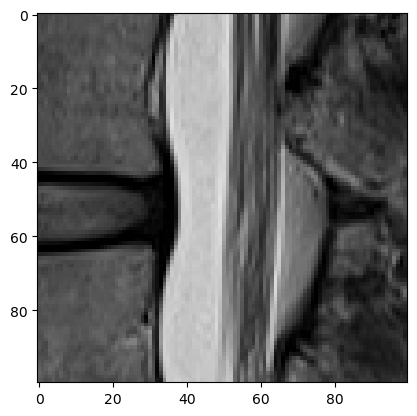

In [12]:
test = Image.open("../../data/temp_data/4003253_702807833_8_320_295.png").convert("RGB")
plt.imshow(test)